In [ ]:
import os
import shutil
import hashlib
import tensorflow as tf
import numpy as np
import itertools
import matplotlib.pyplot as plt
from sklearn.utils import class_weight
import time
from tensorflow.keras import layers
from helper_functions import load_and_prep_image, make_confusion_matrix, plot_loss_curves



In [ ]:



# I am working on kaggle notebook
master_dataset = '/kaggle/input/datasets/satvik124/cattle-breed-master-dataset'

model_path = '/kaggle/input/datasets/satvik124/convent-75-model/convnext_model_improved.keras'



In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    master_dataset,
    validation_split=0.2,
    subset='training',
    seed=42,
    image_size=(224,224),
    batch_size=32
)

val_ds= tf.keras.utils.image_dataset_from_directory(
    master_dataset,
    validation_split=0.2,
    subset='validation',
    seed=42,
    image_size=(224,224),
    batch_size=32
)


Found 7808 files belonging to 50 classes.
Using 6247 files for training.


I0000 00:00:1784527209.867229      23 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13756 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1784527209.870272      23 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13756 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Found 7808 files belonging to 50 classes.
Using 1561 files for validation.


In [5]:
print(len(train_ds.class_names))
print(train_ds.class_names[0])

50
Amritmahal


## Analyzing the 75% model

In [ ]:
# the custom loss function used for the model
@tf.keras.utils.register_keras_serializable()
def sparse_categorical_crossentropy_with_smoothing(y_true, y_pred):
    # 1. Convert integer labels to one-hot (50 is your number of breeds)
    y_true_one_hot = tf.one_hot(tf.cast(y_true, tf.int32), depth=50)

    # 2. Use CategoricalCrossentropy which DOES support label smoothing
    return tf.keras.losses.categorical_crossentropy(
        y_true_one_hot,
        y_pred,
        label_smoothing=0.1
    )

In [7]:
model1 = tf.keras.models.load_model(model_path)

/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 98 variables whereas the saved optimizer has 102 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
# model1.evaluate(val_ds)  the accuracy came around 75% with loss of 1.5316 

In [9]:
class_names = train_ds.class_names

In [ ]:

start = time.time()
results = []

y_true = []
y_pred = []

for images, labels in val_ds: # labels and images are in batches of 32

    preds = model1.predict(images, verbose=0)
    pred_classes = np.argmax(preds, axis=1)

    y_true.extend(labels.numpy())
    y_pred.extend(pred_classes)

    for i in range(len(labels)):
        results.append({
            "image": images[i].numpy(),
            "true": int(labels[i].numpy()),
            "pred": int(pred_classes[i]),
            "confidence": float(np.max(preds[i]))
        })

print("Time:", time.time() - start)

I0000 00:00:1784527232.727436      79 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Time: 100.76251721382141


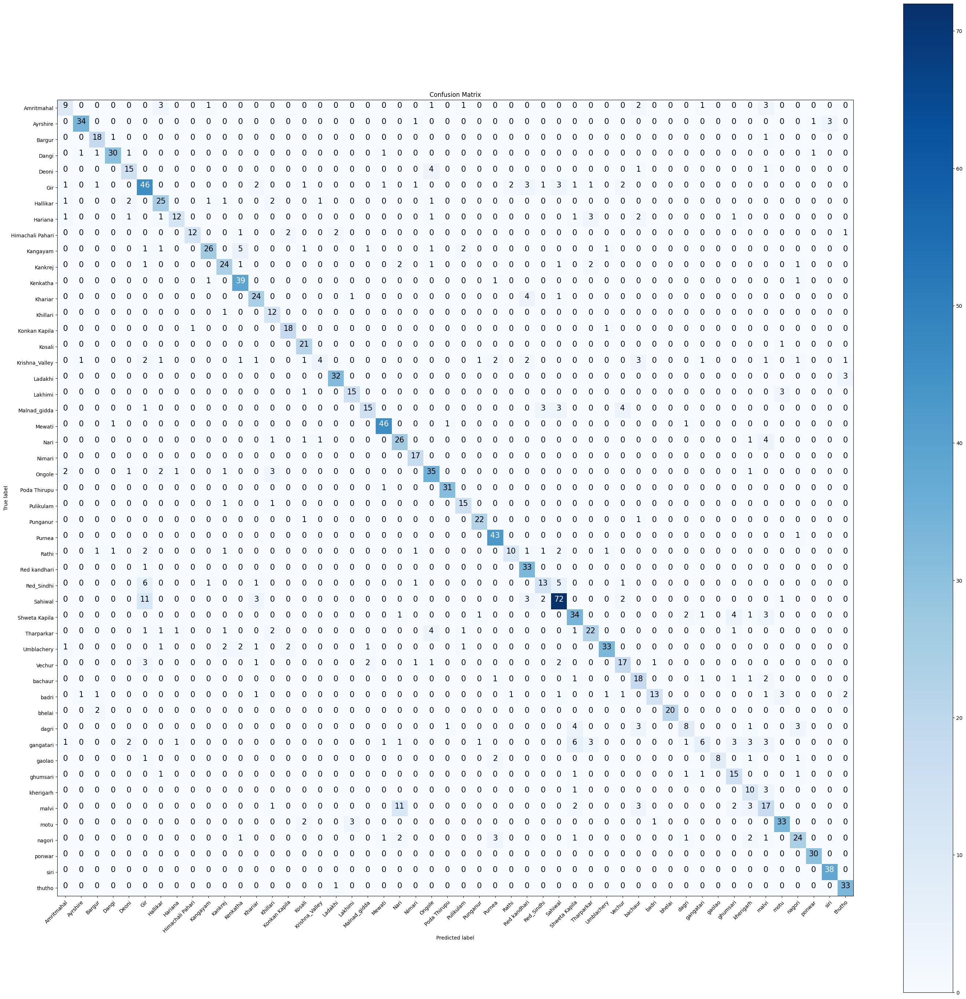

In [14]:
make_confusion_matrix(y_true, y_pred, class_names, figsize=(35, 35))



### Observations

- The confusion matrix shows a **strong diagonal**, indicating that the model correctly classifies a large proportion of the validation images.

- There is **no dominant prediction class**. Misclassified samples are distributed among several breeds rather than being incorrectly predicted as one particular breed. This suggests that the model has learned meaningful breed-specific features instead of developing a strong prediction bias.

- Several breeds (e.g., **Poda Thirupu, Siri, Ponwar, Bhelai, Mewati**) have very strong diagonal entries with very few off-diagonal errors, indicating that these breeds are well separated by the model.

- Some breeds exhibit noticeably weaker diagonals and are confused with multiple other breeds. These classes correspond to the lowest F1-scores observed in the classification report and are likely the primary contributors to the remaining classification errors.

- Certain visually similar breeds (e.g., **Red Sindhi and Sahiwal**) show repeated confusion, suggesting that inter-class visual similarity is a significant challenge for the classifier.




In [15]:
from sklearn.metrics import classification_report
import pandas as pd

report = classification_report(
    y_true,
    y_pred,
    target_names=class_names,
    output_dict=True
)

report_df = pd.DataFrame(report).transpose()

report_df

,precision,recall,f1-score,support
Amritmahal,0.562500,0.428571,0.486486,21.000000
Ayrshire,0.918919,0.871795,0.894737,39.000000
Bargur,0.750000,0.900000,0.818182,20.000000
Dangi,0.909091,0.857143,0.882353,35.000000
Deoni,0.681818,0.714286,0.697674,21.000000
Gir,0.605263,0.696970,0.647887,66.000000
Hallikar,0.694444,0.735294,0.714286,34.000000
Hariana,0.800000,0.521739,0.631579,23.000000
Himachali Pahari,0.923077,0.666667,0.774194,18.000000
Kangayam,0.866667,0.666667,0.753623,39.000000


In [16]:
worst_performing_breeds = report_df.sort_values("f1-score").head(5)
worst_performing_breeds

,precision,recall,f1-score,support
Krishna_Valley,0.666667,0.173913,0.275862,23.0
gangatari,0.545455,0.187500,0.279070,32.0
malvi,0.425000,0.435897,0.430380,39.0
dagri,0.571429,0.400000,0.470588,20.0
Amritmahal,0.562500,0.428571,0.486486,21.0


In [20]:
worst_class_index = []
for i in range(len(class_names)):
  if class_names[i] in ['Krishna_Valley', 'gangatari', 'malvi', 'dagri', 'Amritmahal']:
    worst_class_index.append(i)

worst_class_index


[0, 16, 39, 40, 44]

1/1 ━━━━━━━━━━━━━━━━━━━━ 16s 16s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


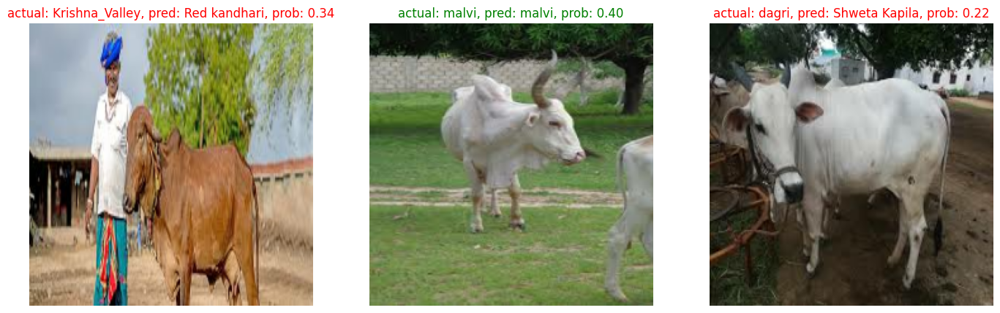

In [ ]:
import random
plt.figure(figsize=(17, 10))
for i in range(3):
  class_ind = random.choice(worst_class_index)
  class_name = class_names[class_ind]
  file_name = random.choice(os.listdir(master_dataset + '/' + class_name))
  image_path = master_dataset + '/' + class_name + '/' + file_name

  img = load_and_prep_image(image_path, scale=False) 
  pred_prob = model1.predict(tf.expand_dims(img,axis=0)) # model accepts tensors of shape [None, 224, 224, 3]
  pred_class = class_names[pred_prob.argmax()] 

  # Plot the image(s)
  plt.subplot(1, 3, i+1)
  plt.imshow(img/255.)
  if class_name == pred_class: # Change the color of text based on whether prediction is right or wrong
    title_color = "g"
  else:
    title_color = "r"
  plt.title(f"actual: {class_name}, pred: {pred_class}, prob: {pred_prob.max():.2f}", c=title_color)
  plt.axis(False);


1. as we can see the prediction prob are low this means the model is not overconfindent

2. background of the images are very very different, some are plain yellow, some have forest, some have water marks

3. some breeds are very similar

#printing correctly classified and missclassified images of worst classes one by one to determine what is the cause

In [23]:
target = class_names.index("Krishna_Valley")

wrong_images = [
    r for r in results
    if r["true"] == target and r["pred"] != target
]

correct_images = [
    r for r in results
    if r["true"] == target and r["pred"] == target
]

In [24]:
import matplotlib.pyplot as plt

def show_images(results, class_names, breed_name, correct=True, n=5):
    target = class_names.index(breed_name)

    if correct: # to display correctly classified images
        samples = [r for r in results
                   if r["true"] == target and r["pred"] == target]
        title = f"Correct Predictions - {breed_name}"
        color = "green"
    else:  # to display missclassified images (correct = False)
        samples = [r for r in results
                   if r["true"] == target and r["pred"] != target]
        title = f"Misclassified Images - {breed_name}"
        color = "red"

    print(f"Found {len(samples)} images")

    plt.figure(figsize=(20,4))
    plt.suptitle(title, fontsize=16)

    for i, sample in enumerate(samples[:n]):
        plt.subplot(1, n, i+1)

        plt.imshow(sample["image"].astype("uint8")) # the images are in float32(as no rescalling done because the images are directly from the dataset) (ex 224.0) so converting them to standard form (224.0->224)

        plt.title(
        f"True: {class_names[sample['true']]}\n"
        f"Pred: {class_names[sample['pred']]}\n"
        f"Conf: {sample['confidence']:.2f}",
        color=color,
        fontsize=10
)

    plt.axis("off")

    plt.tight_layout()
    plt.show()

Found 19 images


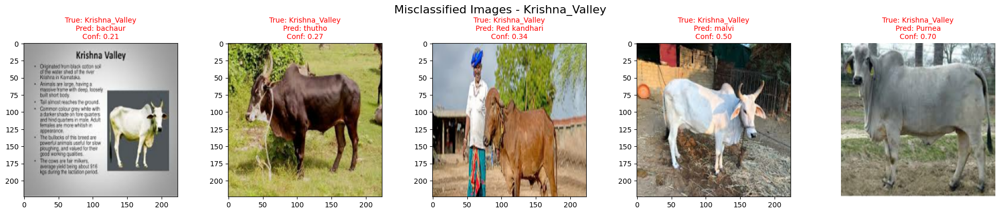

Found 4 images


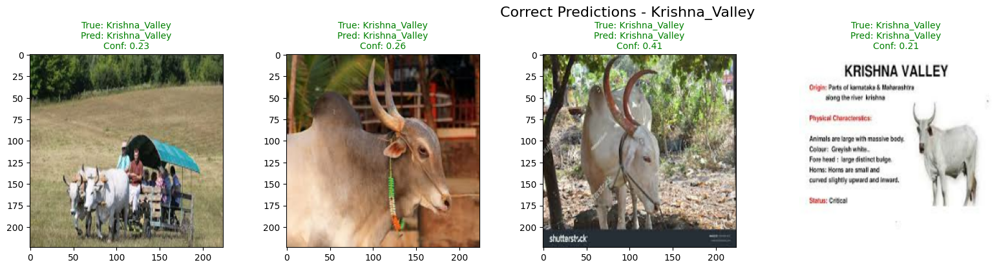

In [25]:
show_images(results, class_names, "Krishna_Valley", correct=False, n=5)
show_images(results, class_names, "Krishna_Valley", correct=True, n=5)


Krishna Valley

Correct: 4 | Wrong: 19

Found 12 images


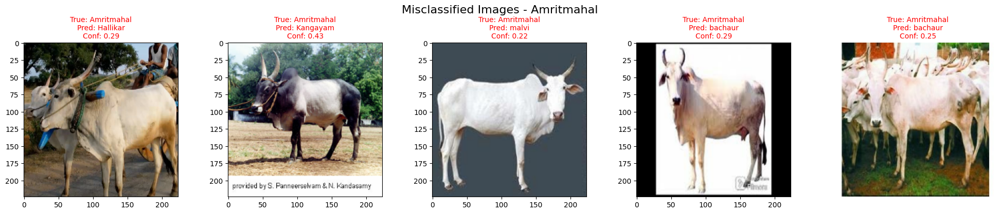

Found 9 images


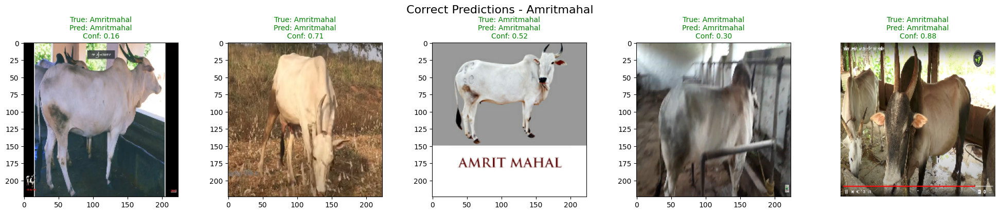

Found 26 images


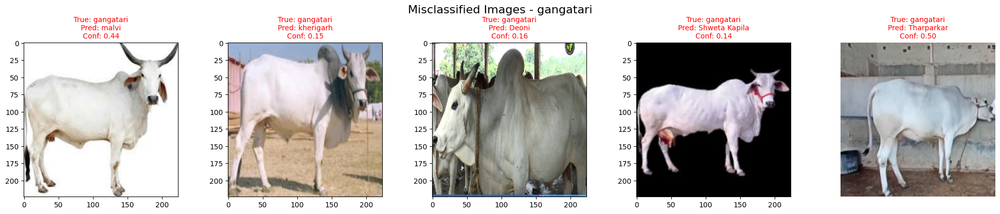

Found 6 images


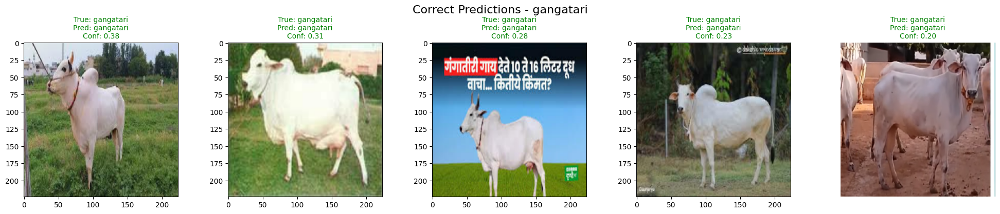

In [26]:
show_images(results, class_names, "Amritmahal", correct=False)
show_images(results, class_names, "Amritmahal", correct=True)

show_images(results, class_names, "gangatari", correct=False)
show_images(results, class_names, "gangatari", correct=True)

# # Observations from Correct vs Misclassified Images
1. The remaining errors are not primarily caused by poor image quality. Several clear, high-quality images are still misclassified.
2. The model correctly classifies images containing watermarks, text overlays, and varying backgrounds, indicating that these artifacts are not the dominant source of errors.
3. Most misclassifications occur between visually similar cattle breeds, suggesting that the task has become a fine-grained classification problem rather than a general object recognition problem.
4. Correct and incorrect predictions contain similar variations in viewpoint, background, lighting, and number of cattle, making it difficult to identify obvious failure patterns through visual inspection alone.
5. Prediction confidence for many misclassified samples is relatively low (≈0.15–0.35), indicating that the model is uncertain rather than confidently making incorrect predictions.
6. Some correctly classified images also have low confidence, suggesting that the model has learned useful features but still struggles to confidently separate similar breeds.

Visual inspection alone is insufficient to determine why individual predictions fail. Further investigation using Grad-CAM is required to verify whether the model is focusing on meaningful cattle features (horns, hump, face, body shape) or on irrelevant background regions

## Using Grad-Cam

In [27]:
model1.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny (Functional)      │ (None, 7, 7, 768)      │    27,820,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ avg_pool                        │ (None, 768)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 768)            │         3,072 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ top_dropout_1 (Dropout)         │ (None, 768)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_refinement (Dense)        │ (None, 256)            │       196,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ top_dropout_2 (Dropout)         │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 50)             │        12,850 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 61,803,512 (235.76 MB)

 Trainable params: 16,885,298 (64.41 MB)

 Non-trainable params: 11,147,616 (42.52 MB)

 Optimizer params: 33,770,598 (128.82 MB)

In [ ]:
for i, layer in enumerate(model1.layers):
     print(i, layer.name, layer.output_shape if hasattr(layer, "output_shape") else "")

    


0 input_layer 
1 sequential (None, 224, 224, 3)
2 convnext_tiny (None, 7, 7, 768)
3 avg_pool 
4 batch_normalization 
5 top_dropout_1 
6 dense_refinement 
7 top_dropout_2 
8 output_layer 


In [ ]:
#model1.summary(expand_nested=True)

In [31]:
convnext = model1.get_layer('convnext_tiny')

print(convnext.input)
print(convnext.output)

[<KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=False, ragged=False, name=input_layer>]
[<KerasTensor shape=(None, 7, 7, 768), dtype=float16, sparse=False, ragged=False, name=keras_tensor_340>]


we will use: convnext_tiny_stage_3_block_2_depthwise_conv

Why?

✅ It is the last convolution operation in the network.

✅ It still produces a spatial feature map (7×7×768).

✅ Everything after it (LayerNorm, GELU, Layer Scale, Identity) only transforms those features; they don't learn new spatial patterns.

We split the architecture into three independent, natively compiled tf.keras.Model objects: Preprocessing, Extractor, and Top Head.


In [34]:
# 1. Find the exact index of the ConvNeXt base model
base_idx = -1
for i, layer in enumerate(model1.layers):
    if layer.name == "convnext_tiny":
        base_idx = i
        break

# 2. Build Preprocessing Model (Handles your data_aug)
prep_input = tf.keras.Input(shape=(224, 224, 3))
x = prep_input
for layer in model1.layers[1:base_idx]: # Skip original input layer
    x = layer(x)
prep_model = tf.keras.Model(inputs=prep_input, outputs=x, name="prep_model")

# 3. Build Extractor Model (The ConvNeXt inner layers)
convnext_base = model1.get_layer("convnext_tiny")
target_conv_layer = convnext_base.get_layer("convnext_tiny_stage_3_block_2_depthwise_conv")
extractor_model = tf.keras.Model(
    inputs=convnext_base.inputs,
    outputs=[target_conv_layer.output, convnext_base.output],
    name="extractor_model"
)

# 4. Build Top Head Model (AvgPool -> BatchNorm -> Dense layers)
# We use the exact output shape of ConvNeXt to guarantee BatchNormalization behaves!
top_input = tf.keras.Input(shape=convnext_base.output_shape[1:]) # this is the input layer for the layers after convnext in my model architecture
#shape of the tensor coming out of your ConvNeXt base model, it looks like this: (None, 7, 7, 768) so [1:] skips the None
y = top_input
for layer in model1.layers[base_idx + 1:]:
    y = layer(y)
top_model = tf.keras.Model(inputs=top_input, outputs=y, name="top_model")

In [ ]:
import tensorflow as tf

@tf.function(reduce_retracing=True)
def fast_gradcam_math(img_tensor, class_index):
    with tf.GradientTape() as tape:
        # Pass through the 3 compiled sub-models 
        prepped = prep_model(img_tensor, training=False)
        conv_outs, base_preds = extractor_model(prepped, training=False)
        preds = top_model(base_preds, training=False)
        
        # Isolate the target class score
        loss = preds[0, class_index] 

    # Calculate and pool gradients
    grads = tape.gradient(loss, conv_outs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Apply weights to feature maps
    conv_outs = conv_outs[0]
    heatmap = conv_outs @ tf.expand_dims(pooled_grads, axis=-1)
    heatmap = tf.squeeze(heatmap)

    # ReLU and Normalize
    return tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + tf.keras.backend.epsilon())


def generate_gradcam_heatmap(img_array, prep_model, extractor_model, top_model, class_index):
    # Convert numpy array to a proper float32 Tensor BEFORE it hits the compiler
    img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
    
    # Add batch dimension if needed
    if len(img_tensor.shape) == 3:
        img_tensor = tf.expand_dims(img_tensor, axis=0)
        
    # Convert the integer class index to a Tensor
    class_tensor = tf.constant(class_index, dtype=tf.int32)
    
    # Run the ultra-fast compiled GPU math
    heatmap_tensor = fast_gradcam_math(img_tensor, class_tensor)
    
    # Convert back to NumPy for Matplotlib
    return heatmap_tensor.numpy()

In [36]:
# 1. Grab a single batch from your validation dataset
# val_ds yields (images, labels) in batches of 32
img_batch , label_batch = next(iter(val_ds))

label_batch, img_batch.shape

(<tf.Tensor: shape=(32,), dtype=int32, numpy=
 array([20, 35, 12, 32, 10, 37, 23, 48,  0, 48, 21, 38, 16, 31, 24, 39, 10,
        33, 46, 23, 31,  3, 32, 49, 34, 18, 45, 38, 12, 11, 31, 16],
       dtype=int32)>,
 TensorShape([32, 224, 224, 3]))

In [37]:
# 2. Pick an index from the batch (0 to 31) to test
sample_idx =0
test_img = img_batch[sample_idx]
true_label_idx = int(label_batch[sample_idx].numpy())
true_label_idx


20

In [38]:
# 3. Get the model's prediction for this specific image
# We expand dims to make it shape (1, 224, 224, 3) for the model
input_tensor = tf.expand_dims(test_img, axis=0)
preds = model1.predict(input_tensor,verbose = 0)
pred_label_idx = np.argmax(preds[0])
confidence = np.max(preds[0])

int(pred_label_idx) , float(confidence) 

(20, 0.975417971611023)

In [ ]:
def plot_gradcam(img, heatmap, intensity=0.4, cam_color='jet'):
    # 1. Resize the heatmap to match the original image size (224, 224)
    heatmap_resized = tf.image.resize(heatmap[..., tf.newaxis], (img.shape[0], img.shape[1]))
    
    # added an additional dimesntion to heatmap as resize excepts 3d input
    heatmap_resized = tf.squeeze(heatmap_resized).numpy()
    
    # 2. Convert the 2D grid into an RGB color map
    cm = plt.get_cmap(cam_color)
    heatmap_colored = cm(heatmap_resized)[..., :3] # Keep RGB channels, drop Alpha
    
    # 3. Superimpose/blend the heatmap onto the original image
    superimposed_img = heatmap_colored * intensity + (img / 255.0)
    
    # 4. Clip values out of boundaries to ensure clean display
    superimposed_img = np.clip(superimposed_img, 0, 1)
    
    return superimposed_img

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_360
Received: inputs=['Tensor(shape=(1, 7, 7, 768))']
  warnings.warn(msg)


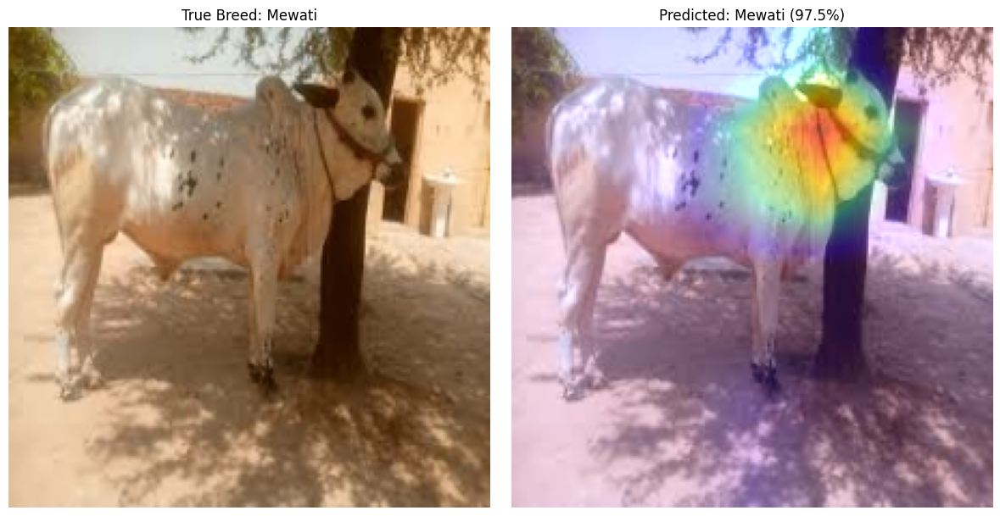

In [ ]:

# 4. Generate the 7x7 Grad-CAM heatmap using our custom function
heatmap = generate_gradcam_heatmap(test_img, prep_model, extractor_model, top_model, pred_label_idx)

# 5. Blend the heatmap over the original image
# test_img is a tensor, we convert it to numpy for plotting
gradcam_result = plot_gradcam(test_img.numpy(), heatmap, intensity=0.4, cam_color='jet')

# 6. Plotting the original image and the Grad-CAM result side-by-side
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Original Image 
axes[0].imshow(test_img.numpy().astype("uint8"))
axes[0].set_title(f"True Breed: {class_names[true_label_idx]}")
axes[0].axis("off")

# Grad-CAM Result
axes[1].imshow(gradcam_result)
axes[1].set_title(f"Predicted: {class_names[pred_label_idx]} ({confidence*100:.1f}%)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


# Analyzing the misclassified images

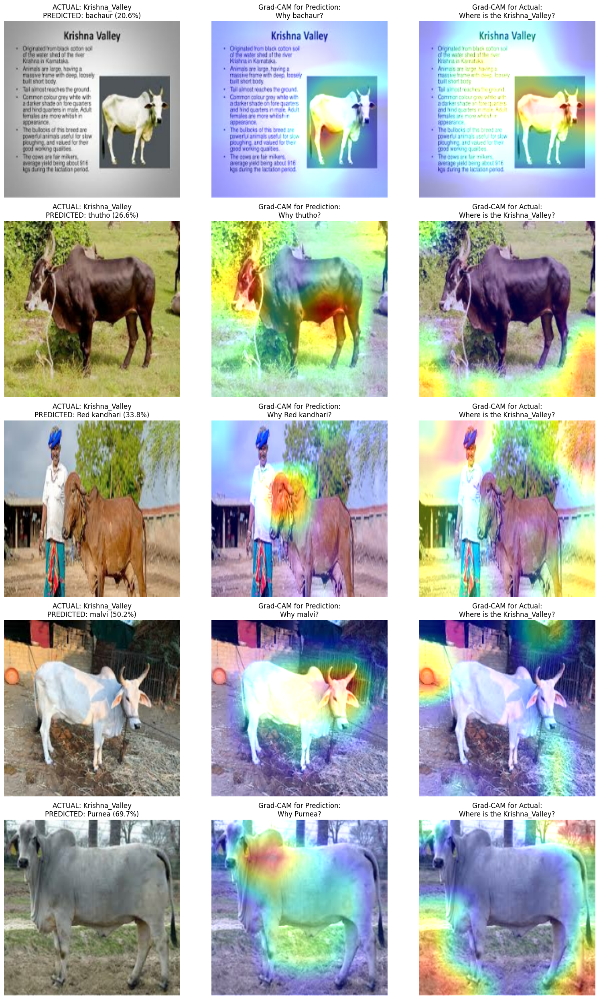

In [ ]:
# 1. Finding the index for Krishna_Valley
target_class_name = "Krishna_Valley"
target_class_idx = list(class_names).index(target_class_name)

# 2. Filter the 'results' array for only misclassified Krishna Valley images
misclassified_samples = [res for res in results 
                         if res['true'] == target_class_idx 
                         and res['pred'] != target_class_idx]

# 3. plotting the first 5 
num_to_show = min(5, len(misclassified_samples))
fig, axes = plt.subplots(num_to_show, 3, figsize=(16, 5 * num_to_show))

for i in range(num_to_show):
    sample = misclassified_samples[i]
    img = sample['image']
    true_idx = sample['true']
    pred_idx = sample['pred']
    conf = sample['confidence']
    
    # --- Column 1: Original Image ---
    axes[i, 0].imshow(img.astype("uint8"))
    axes[i, 0].set_title(f"ACTUAL: {class_names[true_idx]}\nPREDICTED: {class_names[pred_idx]} ({conf*100:.1f}%)")
    axes[i, 0].axis("off")
    
    # --- Column 2: Heatmap of the WRONG Prediction ---
    # We pass 'pred_idx' to see what visual features convinced the model it was the wrong breed
    heatmap_pred = generate_gradcam_heatmap(img, prep_model, extractor_model, top_model, pred_idx)
    overlay_pred = plot_gradcam(img, heatmap_pred)
    axes[i, 1].imshow(overlay_pred)
    axes[i, 1].set_title(f"Grad-CAM for Prediction:\nWhy {class_names[pred_idx]}?")
    axes[i, 1].axis("off")
    
    # --- Column 3: Heatmap of the TRUE Breed ---
    # We pass 'true_idx' to see what the model was looking at when it rejected Krishna Valley
    heatmap_true = generate_gradcam_heatmap(img, prep_model, extractor_model, top_model, true_idx)
    overlay_true = plot_gradcam(img, heatmap_true)
    axes[i, 2].imshow(overlay_true)
    axes[i, 2].set_title(f"Grad-CAM for Actual:\nWhere is the {class_names[true_idx]}?")
    axes[i, 2].axis("off")

plt.tight_layout()
plt.show()

Column 2 (The Distraction): You are asking, "What convinced you to be so confident about the WRONG answer?" (This shows the model's active biases).
we are feeding it the breed to which its getting confused with the true breed

Column 3 (The Blind Spot): You are asking, "What features are you using to define the TRUE breed?" (This shows the model's ignorance).
here we are feeding the true breed and asking where are you actually looking to give the wrong prediction

The model is not consistently looking at the cattle and is getting distracted with the background for these breeds,the dataset is not good as it contain images with texts and humans.



## Retraining on the Cleaned Dataset

The analysis above revealed an important limitation in the original dataset. 
Grad-CAM showed that the model could sometimes rely on irrelevant visual cues,
including backgrounds, text, and human figures, rather than cattle-specific
features.

Therefore, the previous ~75% validation accuracy should not be treated as a
reliable measure of real-world cattle breed classification performance.

I created a larger and cleaned dataset, removing problematic/non-representative
images and splitting the data into separate training, validation, and test sets.

The model was then retrained using a different architecture and additional
regularization and augmentation techniques.

The resulting test accuracy is lower than the original model, but it is
measured on a held-out, cleaned test set and therefore provides a more
meaningful estimate of the model's actual performance.

In [2]:
tf.keras.utils.set_random_seed(123) 

# Training the model on the new dataset

In [5]:
import json
import os
dataset_root = '/kaggle/input/datasets/satvik124/master-dataset-leakproof/master_dataset_capped'
with open(f'{dataset_root}/class_names.json') as f:
    class_names = json.load(f)

num_classes = len(class_names)
print(f'{num_classes} classes loaded')

img_size = (224,224)


train_ds = tf.keras.utils.image_dataset_from_directory(
    f"{dataset_root}/train",
    image_size = img_size,
    batch_size = 16,
    seed = 123,
    label_mode = 'int'
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    f"{dataset_root}/val",
    image_size = img_size,
    batch_size = 16,
    seed = 123,
    label_mode = 'int'
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    f"{dataset_root}/test",
    image_size = img_size,
    batch_size = 16,
    seed = 123,
    label_mode = 'int'
)

assert train_ds.class_names == class_names, "class_names.json doesn't match folder order — investigate before continuing"



50 classes loaded
Found 8303 files belonging to 50 classes.


I0000 00:00:1787470947.454978      24 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13756 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1787470947.457878      24 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13756 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Found 999 files belonging to 50 classes.
Found 992 files belonging to 50 classes.


Class weights

In [6]:
from sklearn.utils import class_weight

train_dir = f'{dataset_root}/train'
train_labels = []
for label_id, breed in enumerate(class_names):
    breed_dir = os.path.join(train_dir, breed)
    count = len([f for f in os.listdir(breed_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
    train_labels.extend([label_id] * count)

weights = class_weight.compute_class_weight(
    class_weight='balanced', classes=np.unique(train_labels), y=train_labels
)
class_weights_dict = {i: float(min(w, 5.0)) for i, w in enumerate(weights)}  # cap kept as a cheap safety net, weights will not exceed 5
print(f"Highest weight: {max(class_weights_dict.values()):.2f} | Lowest: {min(class_weights_dict.values()):.2f}")

Highest weight: 2.52 | Lowest: 0.33


# mixup
mixup: blends two different label images thus prevents the model from ever seeing a "pure, 100% confident, one class" example, which makes it harder to just memorize sharp boundaries around individual training images — reduces overfitting.

In [ ]:
data_aug = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.15),
    layers.RandomZoom(0.15),
    layers.RandomTranslation(height_factor=0.1, width_factor=0.1), 
    layers.RandomContrast(0.2)
], name="data_augmentation")



def to_one_hot(images, labels):
    return images, tf.one_hot(labels, num_classes)

def augment(images, labels):
    return data_aug(images, training=True), labels

def mixup(images, labels, alpha=0.2):
    batch_size = tf.shape(images)[0]
    
    # Pure TF2 Beta distribution sampling
    gamma_1 = tf.random.gamma(shape=[1], alpha=alpha)
    gamma_2 = tf.random.gamma(shape=[1], alpha=alpha)
    lam = gamma_1 / (gamma_1 + gamma_2)
    lam = tf.cast(lam[0], tf.float32)
    
    idx = tf.random.shuffle(tf.range(batch_size))
    images_mixed = lam * images + (1 - lam) * tf.gather(images, idx)
    labels_mixed = lam * labels + (1 - lam) * tf.gather(labels, idx)
    return images_mixed, labels_mixed

AUTOTUNE = tf.data.AUTOTUNE

train_ds_final = (train_ds
    .map(to_one_hot, num_parallel_calls=AUTOTUNE)
    .map(augment, num_parallel_calls=AUTOTUNE)
    .map(lambda x, y: mixup(x, y), num_parallel_calls=AUTOTUNE)
    .prefetch(AUTOTUNE))

val_ds_final = val_ds.map(to_one_hot, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
test_ds_final = test_ds.map(to_one_hot, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)

: it's not that mixed images "can't be one-hot encoded" — the label actually still is a form of one-hot, just blended (e.g. [0, ..., 0.7, ..., 0.3, ..., 0] instead of [0, ..., 1, ..., 0]). The reason you can't use sparse_categorical_crossentropy is different: that function expects the label to be a single integer (like 7 for "gir"), because internally it just does -log(prediction[7]). But a blended label isn't one class anymore, it's two classes weighted — there's no single integer that represents "70% gir, 30% sahiwal." So you need the loss function that accepts the full weighted vector directly, which is categorical_crossentropy.

In [9]:
tf.keras.mixed_precision.set_global_policy('mixed_float16')

In [ ]:

base_model = tf.keras.applications.ConvNeXtSmall(
    include_top = False,
    weights = 'imagenet',
    input_shape = (224,224,3),
    include_preprocessing=True
)
base_model.trainable = False 
inputs = tf.keras.Input(shape=(224, 224, 3))
x = base_model(inputs,training = False) 
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.LayerNormalization(epsilon=1e-6)(x)

x = tf.keras.layers.Dense(256, activation='gelu')(x) # did'nt used regulizer as it would double dip the decaying(adam w is already doing it)
x = tf.keras.layers.Dropout(0.6)(x)
outputs = tf.keras.layers.Dense(num_classes, activation='softmax', dtype='float32')(x)

model = tf.keras.Model(inputs, outputs)
model.summary()


198551472/198551472 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_small (Functional)     │ (None, 7, 7, 768)      │    49,454,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 768)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ layer_normalization_1           │ (None, 768)            │         1,536 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       196,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 50)             │        12,850 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 49,665,938 (189.46 MB)

 Trainable params: 211,250 (825.20 KB)

 Non-trainable params: 49,454,688 (188.65 MB)

# Way of using both class_weights and mixup together

Class weights and mixup cannot be used together as class weights requires int labels but during mixups the labels are not int anymore its like: [0.7+0.3] etc so we are not going to use class_weights during the compilation of the model, instead we are going to build a coustom loss fucntion for it

In [11]:
#Converting the existing class_weights_dict into a flat TensorFlow constant
weight_list = [class_weights_dict[i] for i in range(num_classes)]
class_weights_tensor = tf.constant(weight_list, dtype=tf.float32)

@tf.keras.utils.register_keras_serializable()
# What it does: This is a crucial decorator. Because you are creating a custom function, Keras won't know how to save it when you call model.save('best_model.keras'). 
#This line registers your function inside the Keras framework so your model saves and loads without throwing a Custom object not found error.
def weighted_mixup_crossentropy(y_true, y_pred):
    # Step A: Calculate standard categorical crossentropy with your 0.05 smoothing
    unweighted_loss = tf.keras.losses.categorical_crossentropy(
        y_true, 
        y_pred, 
        label_smoothing=0.05
    )
    
    # Step B: Dynamically blend the class weights based on the mixup ratio!
    # tf.reduce_sum multiplies the one-hot/mixup ratios by the weight array
    sample_weights = tf.reduce_sum(y_true * class_weights_tensor, axis=-1)
    
    # Step C: Multiply the base loss by the dynamically blended weight
    return unweighted_loss * sample_weights

 **Step A** : This calculates the standard "base" loss between the model's guess and the true mixed labels, applying the 0.05 label smoothing you wanted. At this stage, it doesn't know anything about class imbalances.

 **Step B**: This is the mathematical magic trick.

It multiplies the y_true array by the class_weights_tensor.

If an image is 70% Dagri (weight 4.0) and 30% Sahiwal (weight 1.0), the multiplication results in: (0.7 * 4.0) = 2.8 and (0.3 * 1.0) = 0.3. All other 48 classes are 0.0 * their_weight = 0.

tf.reduce_sum(..., axis=-1) adds those numbers together across the row. 2.8 + 0.3 = 3.1.

It has successfully created a dynamic penalty weight of 3.1 for this specific, newly generated MixUp image.

**Step C**: Finally, it takes the base loss from earlier and multiplies it by your dynamic 3.1 sample weight. The optimizer looks at this heavily magnified loss and says, "Whoa, I made a mistake on a highly-weighted image, I need to adjust my weights drastically!"

In [ ]:
model.compile(
    optimizer=tf.keras.optimizers.AdamW(learning_rate=1e-3, weight_decay=1e-4), # using adamW instead of plain adam 
    loss=weighted_mixup_crossentropy, 
    metrics=['accuracy']
)

his_1 = model.fit(
    train_ds_final,
    validation_data=val_ds_final,
    epochs=60
)


Epoch 1/60


I0000 00:00:1787470995.959454      76 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


519/519 ━━━━━━━━━━━━━━━━━━━━ 301s 415ms/step - accuracy: 0.0917 - loss: 3.6956 - val_accuracy: 0.1391 - val_loss: 3.4933
Epoch 2/60
519/519 ━━━━━━━━━━━━━━━━━━━━ 61s 116ms/step - accuracy: 0.1627 - loss: 3.2821 - val_accuracy: 0.2583 - val_loss: 3.1296
Epoch 3/60
519/519 ━━━━━━━━━━━━━━━━━━━━ 60s 115ms/step - accuracy: 0.1976 - loss: 3.1249 - val_accuracy: 0.2803 - val_loss: 3.0552
Epoch 4/60
519/519 ━━━━━━━━━━━━━━━━━━━━ 60s 116ms/step - accuracy: 0.2188 - loss: 3.0264 - val_accuracy: 0.2883 - val_loss: 2.8924
Epoch 5/60
519/519 ━━━━━━━━━━━━━━━━━━━━ 60s 115ms/step - accuracy: 0.2333 - loss: 2.9539 - val_accuracy: 0.3063 - val_loss: 2.8218
Epoch 6/60
519/519 ━━━━━━━━━━━━━━━━━━━━ 60s 115ms/step - accuracy: 0.2365 - loss: 2.9282 - val_accuracy: 0.2663 - val_loss: 2.8996
Epoch 7/60
519/519 ━━━━━━━━━━━━━━━━━━━━ 60s 115ms/step - accuracy: 0.2603 - loss: 2.8698 - val_accuracy: 0.3463 - val_loss: 2.7471
Epoch 8/60
519/519 ━━━━━━━━━━━━━━━━━━━━ 60s 115ms/step - accuracy: 0.2624 - loss: 2.8608 - va

For any single weight, Adam doesn't just look at "the gradient right now" — it keeps a running average of how big/volatile that weight's own gradients have been recently, and uses that history to scale down (or up) its update. That's the "adaptive" part — each weight gets its own personal step-size, based on its own noise history.

With L2-in-the-loss (plain Adam): the real cross-entropy gradient and the decay gradient (proportional to the weight's value) get added together first, into one combined number, before Adam applies that weight's personal adaptive scaling. So the decay portion gets scaled by whatever volatility that same weight happens to have from its normal training signal — a weight with loud, jumpy real gradients has its decay dampened right along with everything else; a weight with quiet, calm real gradients passes its decay through almost fully. Since every weight has a different gradient history, every weight ends up decaying by a different, accidental amount — not because other weights interfered, but because each weight's own adaptive scaling was never meant to apply to the decay term in the first place.

With AdamW: the two signals never get merged. Adam computes its adaptive update from the real gradient only, applies it. Then, as a completely separate operation, every weight gets shrunk by the same flat percentage (weight_decay), untouched by any of that per-weight adaptive scaling. So yes — "both are calculated differently, and the decay is fixed" is exactly right, just: fixed across all weights uniformly, rather than being fixed for each weight individually (it's fixed globally, not per-parameter).

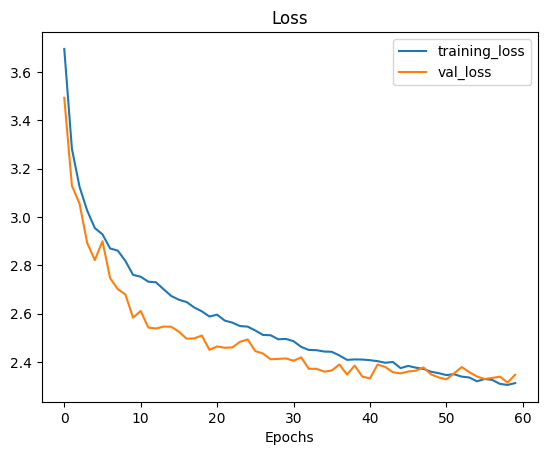

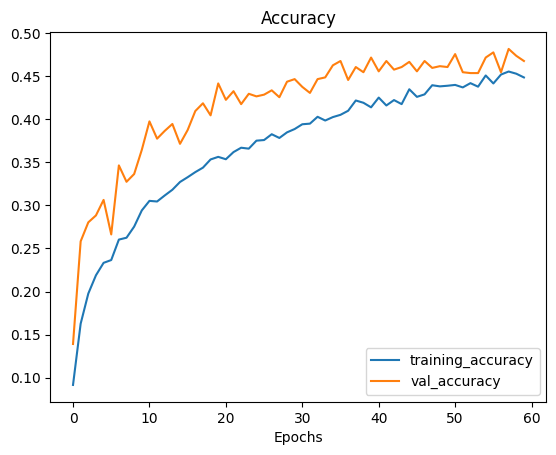

In [14]:
plot_loss_curves(his_1)

In [15]:
phase_1_best_val_accuracy = max(his_1.history['val_accuracy'])

In [ ]:
base_model.trainable = True

for layer in base_model.layers[:-30]:
    layer.trainable = False

print(f"Trainable backbone layers: {sum(l.trainable for l in base_model.layers)} / {len(base_model.layers)}")

model.compile(
    optimizer=tf.keras.optimizers.AdamW(learning_rate=1e-5, weight_decay=1e-4), 
    loss=weighted_mixup_crossentropy, 
    metrics=['accuracy']
)


callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7),
    tf.keras.callbacks.ModelCheckpoint('/kaggle/working/best_model.keras',
                                        monitor='val_accuracy', save_best_only=True,
                                      initial_value_threshold= phase_1_best_val_accuracy
                                      )
]

his_2 = model.fit(
    train_ds_final,
    validation_data=val_ds_final,
    initial_epoch=60,
    epochs=100,
    callbacks=callbacks
)

Trainable backbone layers: 30 / 259
Epoch 61/100
519/519 ━━━━━━━━━━━━━━━━━━━━ 313s 416ms/step - accuracy: 0.4732 - loss: 2.2442 - val_accuracy: 0.4865 - val_loss: 2.3115 - learning_rate: 1.0000e-05
Epoch 62/100
519/519 ━━━━━━━━━━━━━━━━━━━━ 66s 126ms/step - accuracy: 0.4821 - loss: 2.2168 - val_accuracy: 0.4905 - val_loss: 2.2829 - learning_rate: 1.0000e-05
Epoch 63/100
519/519 ━━━━━━━━━━━━━━━━━━━━ 64s 121ms/step - accuracy: 0.4872 - loss: 2.2153 - val_accuracy: 0.4855 - val_loss: 2.2792 - learning_rate: 1.0000e-05
Epoch 64/100
519/519 ━━━━━━━━━━━━━━━━━━━━ 84s 126ms/step - accuracy: 0.4952 - loss: 2.1917 - val_accuracy: 0.4965 - val_loss: 2.2642 - learning_rate: 1.0000e-05
Epoch 65/100
519/519 ━━━━━━━━━━━━━━━━━━━━ 63s 121ms/step - accuracy: 0.5017 - loss: 2.1703 - val_accuracy: 0.4895 - val_loss: 2.2560 - learning_rate: 1.0000e-05
Epoch 66/100
519/519 ━━━━━━━━━━━━━━━━━━━━ 64s 122ms/step - accuracy: 0.5010 - loss: 2.1634 - val_accuracy: 0.4895 - val_loss: 2.2363 - learning_rate: 1.0000e-

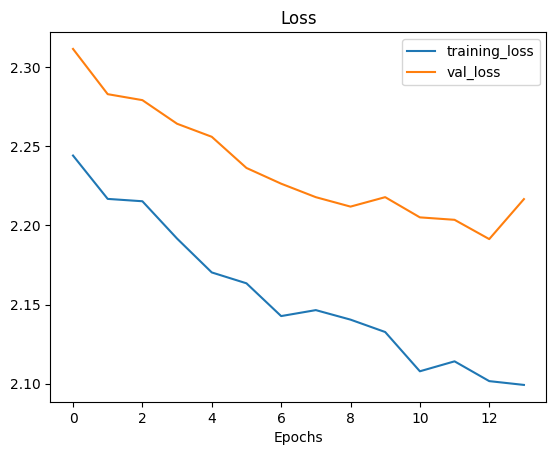

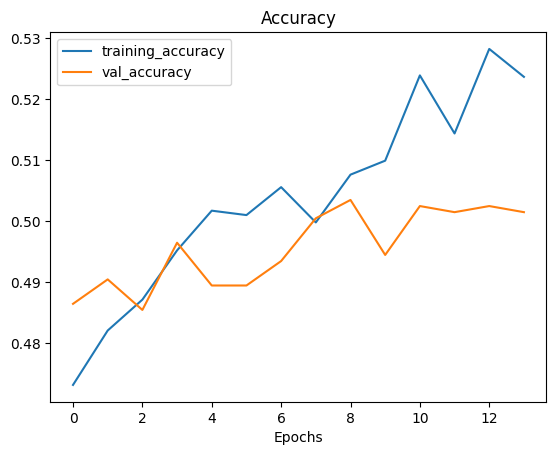

In [17]:
plot_loss_curves(his_2)

In [18]:
last_trained_epoch = his_2.epoch[-1]
next_start_epoch = last_trained_epoch + 1
epoch = next_start_epoch + 50
phase_2_best_val_accuracy = max(his_2.history['val_accuracy'])

In [ ]:
# Phase 3
base_model.trainable = True
for layer in base_model.layers:
    layer.trainable = True          
for layer in base_model.layers[:-60]:
    layer.trainable = False         
print(f"Trainable backbone layers: {sum(l.trainable for l in base_model.layers)} / {len(base_model.layers)}")

callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=6, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7, cooldown = 2),
    tf.keras.callbacks.ModelCheckpoint('/kaggle/working/best_model.keras',
                                        monitor='val_accuracy', save_best_only=True,
                                       initial_value_threshold= phase_2_best_val_accuracy
                                      )
]

model.compile(
    optimizer=tf.keras.optimizers.AdamW(learning_rate=1e-6, weight_decay=1e-4),
    loss=weighted_mixup_crossentropy, 
    metrics=['accuracy']
)

print("Starting Phase 3: Thawing Top 60 Layers...")
his_3 = model.fit(
    train_ds_final,
    validation_data=val_ds_final,
    initial_epoch=next_start_epoch, 
    epochs=epoch,        
    callbacks=callbacks 
)

Trainable backbone layers: 60 / 259
Starting Phase 3: Thawing Top 60 Layers...
Epoch 75/124
519/519 ━━━━━━━━━━━━━━━━━━━━ 347s 454ms/step - accuracy: 0.5125 - loss: 2.1303 - val_accuracy: 0.5015 - val_loss: 2.2204 - learning_rate: 1.0000e-06
Epoch 76/124
519/519 ━━━━━━━━━━━━━━━━━━━━ 72s 138ms/step - accuracy: 0.5135 - loss: 2.1462 - val_accuracy: 0.5055 - val_loss: 2.2136 - learning_rate: 1.0000e-06
Epoch 77/124
519/519 ━━━━━━━━━━━━━━━━━━━━ 68s 130ms/step - accuracy: 0.5195 - loss: 2.1262 - val_accuracy: 0.5055 - val_loss: 2.2157 - learning_rate: 1.0000e-06
Epoch 78/124
519/519 ━━━━━━━━━━━━━━━━━━━━ 68s 130ms/step - accuracy: 0.5240 - loss: 2.1101 - val_accuracy: 0.5025 - val_loss: 2.2114 - learning_rate: 1.0000e-06
Epoch 79/124
519/519 ━━━━━━━━━━━━━━━━━━━━ 86s 138ms/step - accuracy: 0.5114 - loss: 2.1353 - val_accuracy: 0.5075 - val_loss: 2.2133 - learning_rate: 1.0000e-06
Epoch 80/124
519/519 ━━━━━━━━━━━━━━━━━━━━ 79s 133ms/step - accuracy: 0.5169 - loss: 2.1246 - val_accuracy: 0.5065 -

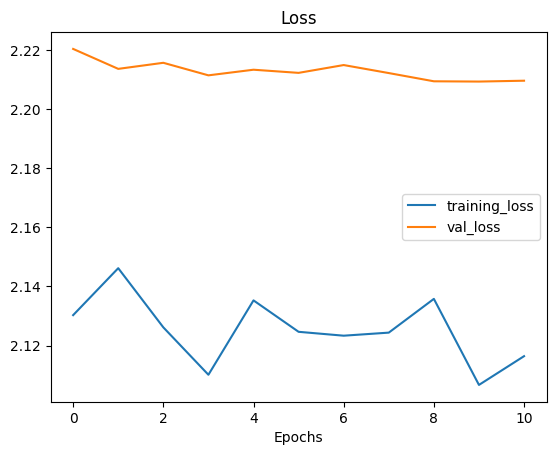

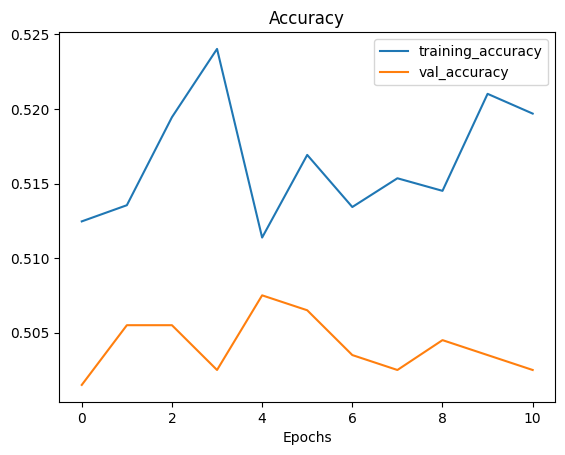

In [20]:
plot_loss_curves(his_3)

In [21]:
last_trained_epoch = his_3.epoch[-1]
next_start_epoch = last_trained_epoch + 1
epoch = next_start_epoch + 50
phase_3_best_val_accuracy = max(his_3.history['val_accuracy'])

In [ ]:
base_model.trainable = True
for layer in base_model.layers:
    layer.trainable = True
print(f"Trainable backbone layers: {sum(l.trainable for l in base_model.layers)} / {len(base_model.layers)}")

model.compile(
    optimizer=tf.keras.optimizers.AdamW(learning_rate=1e-6, weight_decay=1e-4),
    loss=weighted_mixup_crossentropy, # <-- CRUCIAL: Keeps Dagri heavily weighted!
    metrics=['accuracy']
)



# Relaxing the patience on our callbacks
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_accuracy', 
        patience=8, # Increased from 5
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss', 
        factor=0.5, 
        patience=4, # Increased from 2
        verbose=1,
        min_lr=1e-7
    ),
    tf.keras.callbacks.ModelCheckpoint(
        '/kaggle/working/best_model.keras',
        monitor='val_accuracy', 
        save_best_only=True,
        initial_value_threshold= phase_3_best_val_accuracy
        
    )
]

his_4 = model.fit(
    train_ds_final,
    validation_data=val_ds_final,
    initial_epoch=next_start_epoch, 
    epochs=epoch,        
    callbacks=callbacks
)

Trainable backbone layers: 259 / 259
Epoch 86/135
519/519 ━━━━━━━━━━━━━━━━━━━━ 703s 858ms/step - accuracy: 0.5115 - loss: 2.1308 - val_accuracy: 0.5095 - val_loss: 2.2009 - learning_rate: 1.0000e-06
Epoch 87/135
519/519 ━━━━━━━━━━━━━━━━━━━━ 170s 326ms/step - accuracy: 0.5267 - loss: 2.0994 - val_accuracy: 0.5095 - val_loss: 2.2027 - learning_rate: 1.0000e-06
Epoch 88/135
519/519 ━━━━━━━━━━━━━━━━━━━━ 175s 336ms/step - accuracy: 0.5311 - loss: 2.0943 - val_accuracy: 0.5145 - val_loss: 2.1975 - learning_rate: 1.0000e-06
Epoch 89/135
519/519 ━━━━━━━━━━━━━━━━━━━━ 175s 336ms/step - accuracy: 0.5263 - loss: 2.1084 - val_accuracy: 0.5165 - val_loss: 2.1890 - learning_rate: 1.0000e-06
Epoch 90/135
519/519 ━━━━━━━━━━━━━━━━━━━━ 175s 336ms/step - accuracy: 0.5261 - loss: 2.0847 - val_accuracy: 0.5185 - val_loss: 2.1883 - learning_rate: 1.0000e-06
Epoch 91/135
519/519 ━━━━━━━━━━━━━━━━━━━━ 176s 337ms/step - accuracy: 0.5378 - loss: 2.0672 - val_accuracy: 0.5215 - val_loss: 2.1809 - learning_rate: 1.

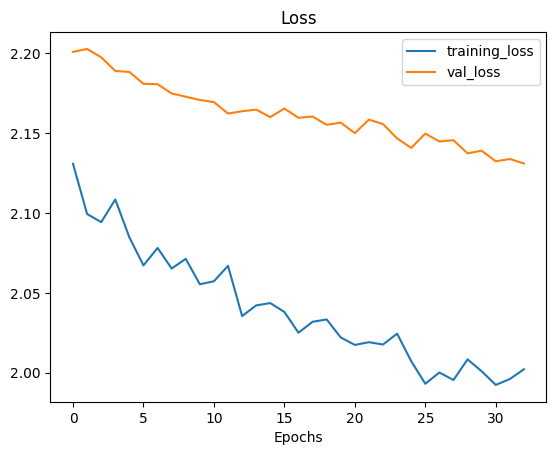

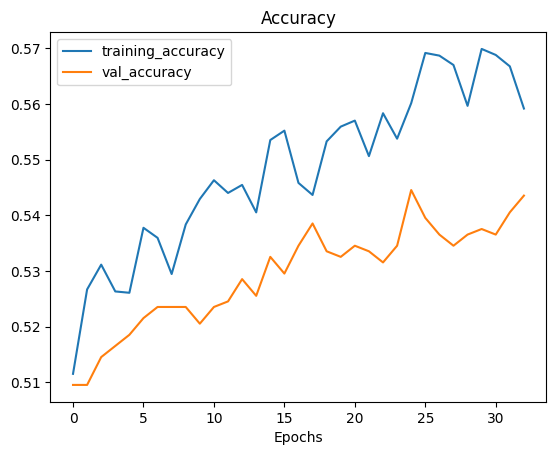

In [23]:
plot_loss_curves(his_4)

Evaluating on completely unseen TEST dataset...
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.5272 - loss: 2.0662
\nFINAL TEST ACCURACY: 52.72%\n
Generating predictions for F1-score plot...


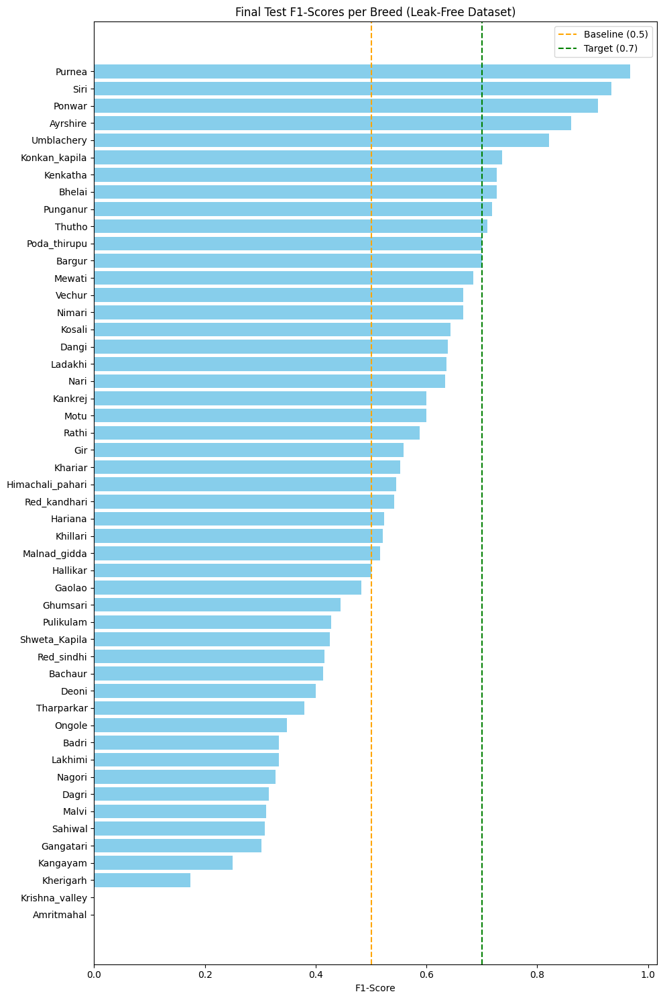

In [ ]:
import pandas as pd
from sklearn.metrics import classification_report

print("Evaluating on completely unseen TEST dataset...")
test_loss, test_acc = model.evaluate(test_ds_final)
print(f"\\nFINAL TEST ACCURACY: {test_acc * 100:.2f}%\\n")

y_true = []
y_pred = []

print("Generating predictions for F1-score plot...")
for images, labels in test_ds_final:
    preds = model.predict(images, verbose=0)
    y_true.extend(np.argmax(labels.numpy(), axis=1)) 
    y_pred.extend(np.argmax(preds, axis=1))

report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
df = pd.DataFrame(report).transpose().iloc[:-3, :] # Remove summary rows

df_sorted = df.sort_values(by='f1-score', ascending=True)
plt.figure(figsize=(10, 15))
plt.barh(df_sorted.index, df_sorted['f1-score'], color='skyblue')
plt.axvline(x=0.5, color='orange', linestyle='--', label='Baseline (0.5)')
plt.axvline(x=0.7, color='green', linestyle='--', label='Target (0.7)')
plt.title("Final Test F1-Scores per Breed (Leak-Free Dataset)")
plt.xlabel("F1-Score")
plt.legend()
plt.tight_layout()
plt.show()

In [26]:
test_loss, test_acc = model.evaluate(test_ds_final)
print(f"Held-out TEST accuracy: {test_acc*100:.2f}%")

model.save('/kaggle/working/splitted_master_dataset_model.keras')

62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.5272 - loss: 2.0662
Held-out TEST accuracy: 52.72%
